## Compare Iris' and Tim's lateral forcing files


Differences between those forcing files:
- I used ORA-20C reanalysis data with 1° resolution 1950-2009, Tim used Glorys data with 1/12° resolution 1993-2019
- Tim used model2roms toolbox and I created my own code
- I used a 1/4° resolution ROMS grid from Dewi and Tim used a 1/8° ROMS grid from Dewi
- 


In [1]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# Import grids
grid4 = xr.open_dataset('/Users/iriskeizer/Documents/ROMS/data/grid/NorthSea4_smooth01_sponge_nudg.nc')
grid8 = xr.open_dataset('/Users/iriskeizer/Documents/ROMS/timnorthsea8/NorthSea8_smooth013_sponge_nudg.nc')

In [3]:
# Import reanalysis data
ora_20c = xr.open_dataset('/Users/iriskeizer/Documents/ROMS/data/ORA20C/forcing input/ora20c.nc')
glorys12 = xr.open_dataset('/Users/iriskeizer/Documents/ROMS/data/GLORYS12V1/processed/glorys.nc')

# Sort coordinates in increasing order
ora_20c = ora_20c.sortby(['depth', 'latitude', 'longitude'])
glorys12 = glorys12.sortby(['depth', 'latitude', 'longitude'])

In [4]:
# Import lateral forcing files Iris
clim_iris = xr.open_dataset('/Users/iriskeizer/Documents/ROMS/data/lateral forcing/NorthSea4 ORA20C/NorthSea4_clim_ORA20C_1950116_to_20091216.nc').load()
init_iris = xr.open_dataset('/Users/iriskeizer/Documents/ROMS/data/lateral forcing/NorthSea4 ORA20C/NorthSea4_init_ORA20C_1950116_to_20091216.nc').load()
bry_iris = xr.open_dataset('/Users/iriskeizer/Documents/ROMS/data/lateral forcing/NorthSea4 ORA20C/NorthSea4_bry_ORA20C_1950116_to_20091216.nc').load()

In [5]:
# Import lateral forcing files Tim 
clim_tim = xr.open_dataset('/Users/iriskeizer/Documents/ROMS/timnorthsea8/NS8_ForcingSmooth01/NS8_clim_GLORYS_19930115_to_20021231.nc').load()
init_tim = xr.open_dataset('/Users/iriskeizer/Documents/ROMS/timnorthsea8/NS8_ForcingSmooth01/NS8_init_GLORYS_19930115_to_20021231.nc').load()
bry_tim = xr.open_dataset('/Users/iriskeizer/Documents/ROMS/timnorthsea8/NS8_ForcingSmooth01/NS8_bry_GLORYS_19930115_to_20021231.nc').load()

In [6]:
# Only keep common years

clim_iris = clim_iris.where(clim_iris.ocean_time.dt.year > 1992, drop = True)
init_iris = init_iris.where(init_iris.ocean_time.dt.year > 1992, drop = True)
bry_iris = bry_iris.where(bry_iris.ocean_time.dt.year > 1992, drop = True)

clim_tim = clim_tim.where(clim_tim.ocean_time.dt.year < 2010, drop = True)
init_tim = init_tim.where(init_tim.ocean_time.dt.year < 2010, drop = True)
bry_tim = bry_tim.where(bry_tim.ocean_time.dt.year < 2010, drop = True)

## Compare climatology files

In [5]:
clim_iris

<xarray.Dataset>
Dimensions:     (eta_rho: 110, xi_rho: 122, eta_u: 110, xi_u: 121, eta_v: 109,
                 xi_v: 122, eta_psi: 109, xi_psi: 121, s_rho: 30, s_w: 31,
                 ocean_time: 720)
Coordinates:
  * s_rho       (s_rho) float64 -0.9833 -0.95 -0.9167 ... -0.05 -0.01667
  * s_w         (s_w) float64 -1.0 -0.9667 -0.9333 ... -0.06667 -0.03333 0.0
  * ocean_time  (ocean_time) datetime64[ns] 1950-01-15 1950-02-15 ... 2009-12-15
Dimensions without coordinates: eta_rho, xi_rho, eta_u, xi_u, eta_v, xi_v,
                                eta_psi, xi_psi
Data variables: (12/28)
    lon_rho     (eta_rho, xi_rho) float64 ...
    lat_rho     (eta_rho, xi_rho) float64 ...
    lon_u       (eta_u, xi_u) float64 ...
    lat_u       (eta_u, xi_u) float64 ...
    lon_v       (eta_v, xi_v) float64 ...
    lat_v       (eta_v, xi_v) float64 ...
    ...          ...
    v           (ocean_time, s_rho, eta_v, xi_v) float32 ...
    salt        (ocean_time, s_rho, eta_rho, xi_rho) float32 ...
    temp        (ocean_time, s_rho, eta_rho, xi_rho) float32 ...
    zeta        (ocean_time, eta_rho, xi_rho) float32 ...
    ubar        (ocean_time, eta_u, xi_u) float32 ...
    vbar        (ocean_time, eta_v, xi_v) float32 ...
Attributes:
    title:        Climatology forcing file (CLIM) used for forcing the ROMS m...
    description:  Created for grid file: NorthSea4_smooth01_sponge_nudg.nc
    grd_file:     Gridfile: .../NorthSea4_smooth01_sponge_nudg.nc
    history:      Created October 10, 2022
    conventions:  CF-1.0

In [6]:
clim_tim

<xarray.Dataset>
Dimensions:     (eta_rho: 218, xi_rho: 242, eta_u: 218, xi_u: 241, eta_v: 217,
                 xi_v: 242, eta_psi: 217, xi_psi: 241, s_rho: 30, s_w: 31,
                 ocean_time: 120)
Coordinates:
  * s_rho       (s_rho) float64 -0.9833 -0.95 -0.9167 ... -0.05 -0.01667
  * s_w         (s_w) float64 -1.0 -0.9667 -0.9333 ... -0.06667 -0.03333 0.0
  * ocean_time  (ocean_time) datetime64[ns] 1993-01-15 1993-02-15 ... 2002-12-15
Dimensions without coordinates: eta_rho, xi_rho, eta_u, xi_u, eta_v, xi_v,
                                eta_psi, xi_psi
Data variables: (12/28)
    lon_rho     (eta_rho, xi_rho) float64 ...
    lat_rho     (eta_rho, xi_rho) float64 ...
    lon_u       (eta_u, xi_u) float64 ...
    lat_u       (eta_u, xi_u) float64 ...
    lon_v       (eta_v, xi_v) float64 ...
    lat_v       (eta_v, xi_v) float64 ...
    ...          ...
    v           (ocean_time, s_rho, eta_v, xi_v) float32 ...
    salt        (ocean_time, s_rho, eta_rho, xi_rho) float32 ...
    temp        (ocean_time, s_rho, eta_rho, xi_rho) float32 ...
    zeta        (ocean_time, eta_rho, xi_rho) float32 ...
    ubar        (ocean_time, eta_u, xi_u) float32 ...
    vbar        (ocean_time, eta_v, xi_v) float32 ...
Attributes:
    title:        Climatology forcing file (CLIM) used for forcing the ROMS m...
    description:  Created for grid file: NORTH_SEA8
    grd_file:     Gridfile: /usr/people/bars/Project_ROMS_NorthSea/RomsData/I...
    history:      Created Fri May 20 14:00:42 2016
    source:       Trond Kristiansen (trond.kristiansen@imr.no)
    type:         File in NETCDF4_CLASSIC format created using MODEL2ROMS
    link:         https://github.com/trondkr/model2roms
    Conventions:  CF-1.0

In [14]:
clim_tim

<xarray.Dataset>
Dimensions:     (eta_rho: 218, xi_rho: 242, eta_u: 218, xi_u: 241, eta_v: 217,
                 xi_v: 242, eta_psi: 217, xi_psi: 241, s_rho: 30, s_w: 31,
                 ocean_time: 120)
Coordinates:
  * s_rho       (s_rho) float64 -0.9833 -0.95 -0.9167 ... -0.05 -0.01667
  * s_w         (s_w) float64 -1.0 -0.9667 -0.9333 ... -0.06667 -0.03333 0.0
  * ocean_time  (ocean_time) datetime64[ns] 1993-01-15 1993-02-15 ... 2002-12-15
Dimensions without coordinates: eta_rho, xi_rho, eta_u, xi_u, eta_v, xi_v,
                                eta_psi, xi_psi
Data variables: (12/28)
    lon_rho     (eta_rho, xi_rho) float64 -19.94 -19.81 -19.69 ... 9.814 9.938
    lat_rho     (eta_rho, xi_rho) float64 35.88 35.88 35.88 ... 61.96 61.96
    lon_u       (eta_u, xi_u) float64 -19.88 -19.75 -19.63 ... 9.628 9.752 9.876
    lat_u       (eta_u, xi_u) float64 35.88 35.88 35.88 ... 61.96 61.96 61.96
    lon_v       (eta_v, xi_v) float64 -19.94 -19.81 -19.69 ... 9.69 9.814 9.938
    lat_v       (eta_v, xi_v) float64 35.95 35.95 35.95 ... 61.91 61.91 61.91
    ...          ...
    v           (ocean_time, s_rho, eta_v, xi_v) float32 ...
    salt        (ocean_time, s_rho, eta_rho, xi_rho) float32 ...
    temp        (ocean_time, s_rho, eta_rho, xi_rho) float32 ...
    zeta        (ocean_time, eta_rho, xi_rho) float32 ...
    ubar        (ocean_time, eta_u, xi_u) float32 ...
    vbar        (ocean_time, eta_v, xi_v) float32 ...
Attributes:
    title:        Climatology forcing file (CLIM) used for forcing the ROMS m...
    description:  Created for grid file: NORTH_SEA8
    grd_file:     Gridfile: /usr/people/bars/Project_ROMS_NorthSea/RomsData/I...
    history:      Created Fri May 20 14:00:42 2016
    source:       Trond Kristiansen (trond.kristiansen@imr.no)
    type:         File in NETCDF4_CLASSIC format created using MODEL2ROMS
    link:         https://github.com/trondkr/model2roms
    Conventions:  CF-1.0

In [13]:
year - 1993

0

### Sea level

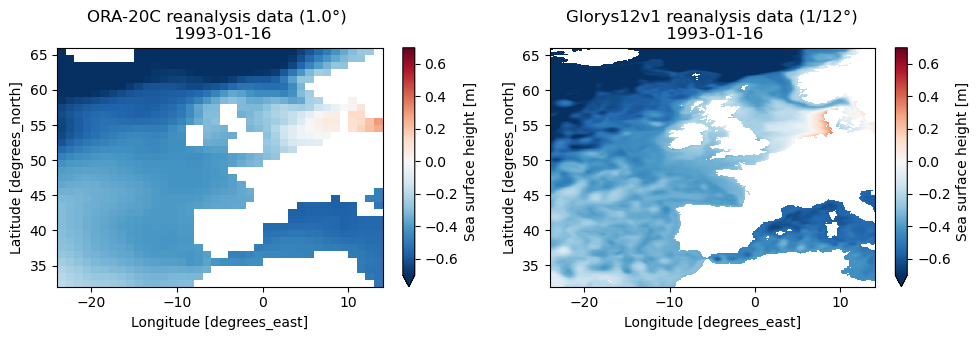

In [16]:
# Some settings
year = 1993



# Create figures
fig, axes = plt.subplots(ncols = 2, figsize = (10,3.5))


ora_20c.zos.isel(time=(year - 1900)*12).plot(ax = axes[0], vmin = -0.7, vmax = 0.7, cmap = 'RdBu_r')
glorys12.zos.isel(time=(year - 1993)).plot(ax = axes[1], vmin = -0.7, vmax = 0.7, cmap = 'RdBu_r')

axes[0].set_title(f'ORA-20C reanalysis data (1.0°) \n {ora_20c.time.isel(time=(year - 1900)*12).dt.date}')
axes[1].set_title(f'Glorys12v1 reanalysis data (1/12°)\n {glorys12.time.isel(time=(year - 1993)).dt.date}')
    
plt.tight_layout()


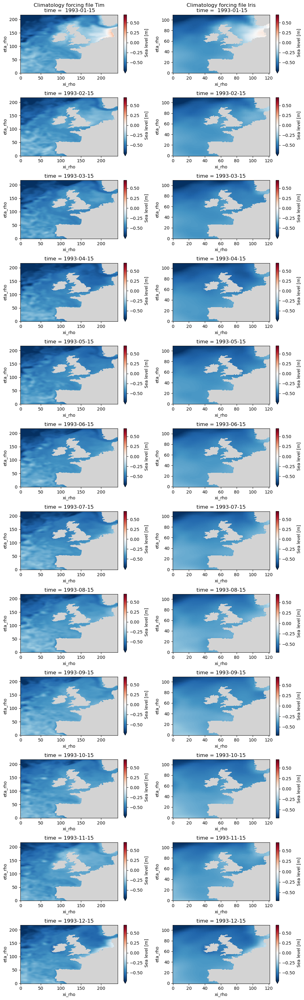

In [10]:
year = 1993

clim_iris['zeta'] = clim_iris.zeta.where(clim_iris.zeta != -9.99e33)

# Create figures
nrows = 12
fig, axes = plt.subplots(ncols = 2, nrows = nrows, figsize = (10, 2.7*nrows))

start = (year - 1993) * 12

for i in range(start, start + 12):
    
    
    
    
    
    # Plot Sea Level maps
    
    
    clim_tim.zeta.isel(ocean_time = i).plot(ax = axes[i, 0], vmin = -0.7, vmax = 0.7, cmap = 'RdBu_r', cbar_kwargs={"label": "Sea level [m]"})
    
    
    if i == 0:
        axes[i, 0].set_title(f'Climatology forcing file Tim\n time =  {clim_tim.ocean_time.isel(ocean_time=i).dt.date}')
    else:
        axes[i, 0].set_title(f'time = {clim_tim.ocean_time.isel(ocean_time = i).dt.date}')
    
    clim_iris.zeta.isel(ocean_time = i).plot(ax = axes[i, 1], vmin = -0.7, vmax = 0.7, cmap = 'RdBu_r', cbar_kwargs={"label": "Sea level [m]"})
   
    if i == 0:
        axes[i, 1].set_title(f'Climatology forcing file Iris\n time =  {clim_iris.ocean_time.isel(ocean_time=i).dt.date}')
    else:
        axes[i, 1].set_title(f'time = {clim_iris.ocean_time.isel(ocean_time = i).dt.date}')
    
    # Change facecolor
    axes[i,0].set_facecolor('lightgray')
    axes[i,1].set_facecolor('lightgray')
    
    
plt.tight_layout()

plt.savefig('comparison_clim_SL')

### Temperature and Salinity

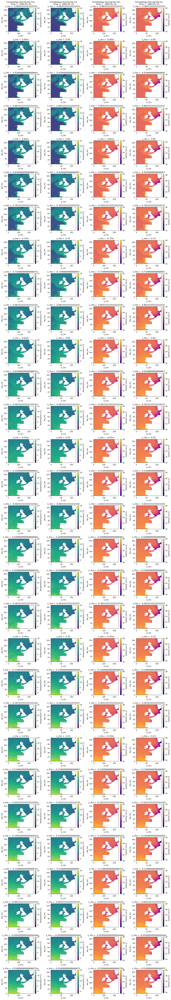

In [35]:
# Some settings
year = 1993
month = 0


clim_iris['temp'] = clim_iris.temp.where(clim_iris.temp != -9.99e33)
clim_iris['salt'] = clim_iris.salt.where(clim_iris.salt != -9.99e33)



# Create figures
nrows = clim_iris.s_rho.size
fig, axes = plt.subplots(ncols = 4, nrows = nrows, figsize = (14, 2.7*nrows))

for i in range(nrows):
    
    # Plot Temperature maps
    
    clim_tim.temp.isel(ocean_time = (year - 1993)*12 + month, s_rho = i).plot(ax = axes[i, 0], vmin = -2, vmax = 20, cbar_kwargs={"label": "Temperature [°C]"})
    
    if i == 0:
        axes[i, 0].set_title(f'Climatology forcing file Tim\n time =  {clim_tim.ocean_time.isel(ocean_time=(year - 1993)*12 + month).dt.date}\n s_rho = {clim_tim.s_rho.isel(s_rho = i)}')
    else:
        axes[i, 0].set_title(f's_rho = {clim_tim.s_rho.isel(s_rho = i)}m')
    
    clim_iris.temp.isel(ocean_time = (year - 1993)*12 + month, s_rho = i).plot(ax = axes[i, 1], vmin = -2, vmax = 20, cbar_kwargs={"label": "Temperature [°C]"})
   
    if i == 0:
        axes[i, 1].set_title(f'Climatology forcing file Iris\n time =  {clim_iris.ocean_time.isel(ocean_time=(year - 1993)*12 + month).dt.date}\n s_rho = {clim_iris.s_rho.isel(s_rho = i)}')
    else:
        axes[i, 1].set_title(f's_rho = {clim_iris.s_rho.isel(s_rho = i)}')
    
    
    
    # Plot Salinity maps
    
    
    clim_tim.salt.isel(ocean_time = (year - 1993)*12 + month, s_rho = i).plot(ax = axes[i, 2], vmin = 30, vmax = 38, cmap = 'plasma', cbar_kwargs={"label": "Salinity [1e-3]"})
    
    if i == 0:
        axes[i, 2].set_title(f'Climatology forcing file Tim\n time =  {clim_tim.ocean_time.isel(ocean_time=(year - 1993)*12 + month).dt.date}\n s_rho = {clim_tim.s_rho.isel(s_rho = i)}')
    else:
        axes[i, 2].set_title(f's_rho = {clim_tim.s_rho.isel(s_rho = i)}m')
    
    clim_iris.salt.isel(ocean_time = (year - 1993)*12 + month, s_rho = i).plot(ax = axes[i, 3], vmin = 30, vmax = 38, cmap = 'plasma', cbar_kwargs={"label": "Salinity [1e-3]"})
   
    if i == 0:
        axes[i, 3].set_title(f'Climatology forcing file Iris\n time =  {clim_iris.ocean_time.isel(ocean_time=(year - 1993)*12 + month).dt.date}\n s_rho = {clim_iris.s_rho.isel(s_rho = i)}')
    else:
        axes[i, 3].set_title(f's_rho = {clim_iris.s_rho.isel(s_rho = i)}')
    
    

    
    
plt.tight_layout()


plt.savefig('comparison_clim_TS')

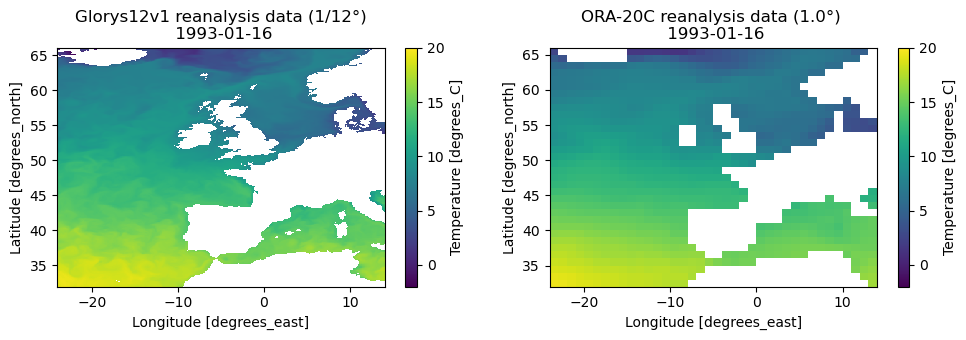

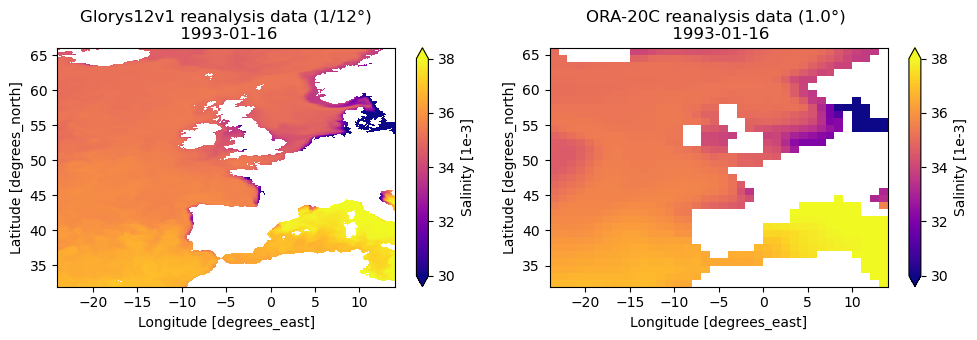

In [32]:
# Some settings
year = 1993



# Create figures
fig, axes = plt.subplots(ncols = 2, figsize = (10,3.5))


ora_20c.thetao.isel(time=(year - 1900)*12, depth = 0).plot(ax = axes[1], vmin = -2, vmax = 20)
glorys12.thetao.isel(time=(year - 1993), depth = 0).plot(ax = axes[0], vmin = -2, vmax = 20)

axes[1].set_title(f'ORA-20C reanalysis data (1.0°) \n {ora_20c.time.isel(time=(year - 1900)*12).dt.date}')
axes[0].set_title(f'Glorys12v1 reanalysis data (1/12°)\n {glorys12.time.isel(time=(year - 1993)).dt.date}')



plt.tight_layout()

# Create figures
fig, axes = plt.subplots(ncols = 2, figsize = (10,3.5))


ora_20c.so.isel(time=(year - 1900)*12, depth = 0).plot(ax = axes[1], vmin = 30, vmax = 38, cmap = 'plasma')
glorys12.so.isel(time=(year - 1993), depth = 0).plot(ax = axes[0], vmin = 30, vmax = 38, cmap = 'plasma')

axes[1].set_title(f'ORA-20C reanalysis data (1.0°) \n {ora_20c.time.isel(time=(year - 1900)*12).dt.date}')
axes[0].set_title(f'Glorys12v1 reanalysis data (1/12°)\n {glorys12.time.isel(time=(year - 1993)).dt.date}')



plt.tight_layout()


In [ ]:
# Some settings
year = 1993



# Create figures
fig, axes = plt.subplots(ncols = 2, figsize = (10,3.5))


ora_20c.so.isel(time=(year - 1900)*12, depth = 0).plot(ax = axes[1], vmin = 30, vmax = 38)
glorys12.so.isel(time=(year - 1993), depth = 0).plot(ax = axes[0], vmin = 30, vmax = 38)

axes[1].set_title(f'ORA-20C reanalysis data (1.0°) \n {ora_20c.time.isel(time=(year - 1900)*12).dt.date}')
axes[0].set_title(f'Glorys12v1 reanalysis data (1/12°)\n {glorys12.time.isel(time=(year - 1993)).dt.date}')



plt.tight_layout()


## Zonal and meridional velocity

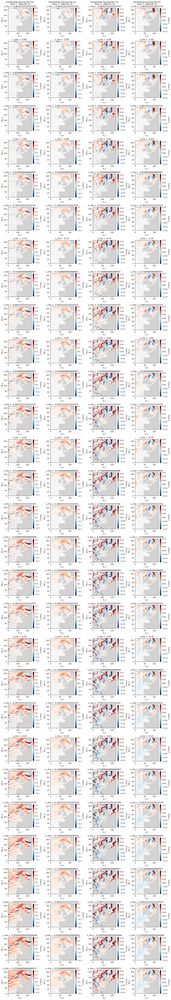

In [36]:
# Some settings
year = 1993
month = 0
time_step = (year - 1993)*12 + month


clim_iris['u'] = clim_iris.u.where(clim_iris.u != -9.99e33)
clim_iris['v'] = clim_iris.v.where(clim_iris.v != -9.99e33)


# Create figures
nrows = clim_iris.s_rho.size
fig, axes = plt.subplots(ncols = 4, nrows = nrows, figsize = (14, 2.7*nrows))

for i in range(nrows):
    
    # Change facecolor
    axes[i,0].set_facecolor('lightgray')
    axes[i,1].set_facecolor('lightgray')
    axes[i,2].set_facecolor('lightgray')
    axes[i,3].set_facecolor('lightgray')
    
    
    
    # Plot Zonal velocity maps
    
    clim_tim.u.isel(ocean_time = time_step, s_rho = i).plot(ax = axes[i, 0], vmin = -0.3, vmax = 0.3, cmap = 'RdBu_r', cbar_kwargs={"label": "U [m/s]"})
    
    
    if i == 0:
        axes[i, 0].set_title(f'Climatology forcing file Tim\n time =  {clim_tim.ocean_time.isel(ocean_time=time_step).dt.date}\n s_rho = {clim_tim.s_rho.isel(s_rho = i)}')
    else:
        axes[i, 0].set_title(f's_rho = {clim_tim.s_rho.isel(s_rho = i)}')
    
    clim_iris.u.isel(ocean_time = time_step, s_rho = i).plot(ax = axes[i, 1], vmin = -0.3, vmax = 0.3, cmap = 'RdBu_r', cbar_kwargs={"label": "U [m/s]"})
   
    if i == 0:
        axes[i, 1].set_title(f'Climatology forcing file Iris\n time =  {clim_iris.ocean_time.isel(ocean_time=time_step).dt.date}\n s_rho = {clim_iris.s_rho.isel(s_rho = i)}')
    else:
        axes[i, 1].set_title(f's_rho = {clim_iris.s_rho.isel(s_rho = i)}')
    
    
    
    # Plot Meridional Velocity maps
    
    
    clim_tim.v.isel(ocean_time = time_step, s_rho = i).plot(ax = axes[i, 2], vmin = -0.15, vmax = 0.15, cmap = 'RdBu_r', cbar_kwargs={"label": "V [m/s]"})
    
    if i == 0:
        axes[i, 2].set_title(f'Climatology forcing file Tim\n time =  {clim_tim.ocean_time.isel(ocean_time=time_step).dt.date}\n s_rho = {clim_tim.s_rho.isel(s_rho = i)}')
    else:
        axes[i, 2].set_title(f's_rho = {clim_tim.s_rho.isel(s_rho = i)}')
    
    clim_iris.v.isel(ocean_time = time_step, s_rho = i).plot(ax = axes[i, 3], vmin = -0.15, vmax = 0.15, cmap = 'RdBu_r', cbar_kwargs={"label": "V [m/s]"})
   
    if i == 0:
        axes[i, 3].set_title(f'Climatology forcing file Iris\n time =  {clim_iris.ocean_time.isel(ocean_time=time_step).dt.date}\n s_rho = {clim_iris.s_rho.isel(s_rho = i)}')
    else:
        axes[i, 3].set_title(f's_rho = {clim_iris.s_rho.isel(s_rho = i)}')
    
    
plt.tight_layout()

plt.savefig('comparison_clim_UV')

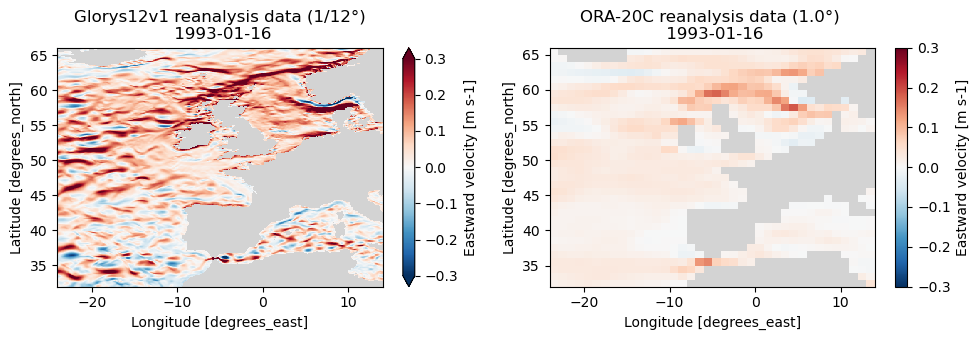

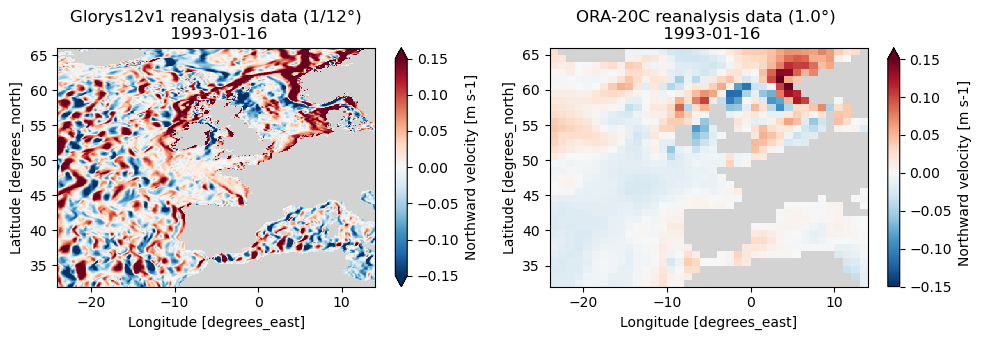

In [37]:
# Some settings
year = 1993



# Create figures
fig, axes = plt.subplots(ncols = 2, figsize = (10,3.5))


ora_20c.uo.isel(time=(year - 1900)*12, depth = 0).plot(ax = axes[1], vmin = -0.3, vmax = 0.3, cmap = 'RdBu_r')
glorys12.uo.isel(time=(year - 1993), depth = 0).plot(ax = axes[0], vmin = -0.3, vmax = 0.3, cmap = 'RdBu_r')

axes[1].set_title(f'ORA-20C reanalysis data (1.0°) \n {ora_20c.time.isel(time=(year - 1900)*12).dt.date}')
axes[0].set_title(f'Glorys12v1 reanalysis data (1/12°)\n {glorys12.time.isel(time=(year - 1993)).dt.date}')

# Change facecolor
axes[0].set_facecolor('lightgray')
axes[1].set_facecolor('lightgray')

plt.tight_layout()

# Create figures
fig, axes = plt.subplots(ncols = 2, figsize = (10,3.5))


ora_20c.vo.isel(time=(year - 1900)*12, depth = 0).plot(ax = axes[1], vmin = -0.15, vmax = 0.15, cmap = 'RdBu_r')
glorys12.vo.isel(time=(year - 1993), depth = 0).plot(ax = axes[0], vmin = -0.15, vmax = 0.15, cmap = 'RdBu_r')

axes[1].set_title(f'ORA-20C reanalysis data (1.0°) \n {ora_20c.time.isel(time=(year - 1900)*12).dt.date}')
axes[0].set_title(f'Glorys12v1 reanalysis data (1/12°)\n {glorys12.time.isel(time=(year - 1993)).dt.date}')

# Change facecolor
axes[0].set_facecolor('lightgray')
axes[1].set_facecolor('lightgray')


plt.tight_layout()
